Tipul imaginii RGB: uint8


(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x2237453b9b0>)

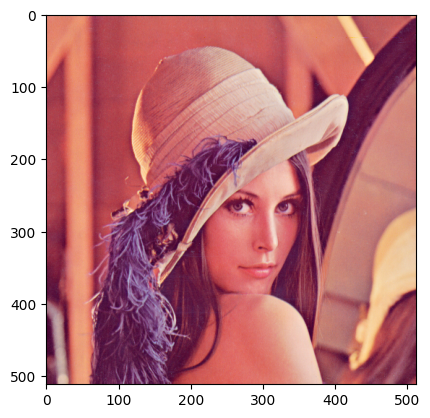

In [61]:
from skimage import io
import matplotlib.pyplot as plt

IMG_RGB = io.imread('lena.png')
print('Tipul imaginii RGB:', IMG_RGB.dtype)
plt.figure(), plt.imshow(IMG_RGB)

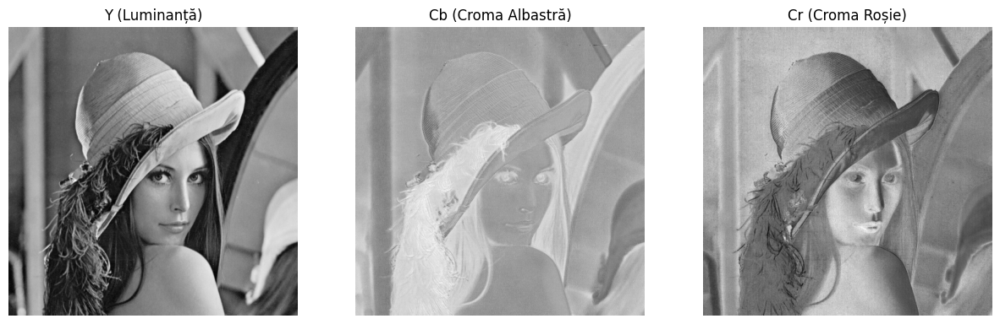

In [62]:
# CONVERSIA LA YCbCr
import numpy as np
from skimage import io, color
import matplotlib.pyplot as plt

image_rgb = io.imread('lena.png')

image_ycbcr = color.rgb2ycbcr(image_rgb)

# 3. Separarea fiecărui plan (canal)
Y_channel = image_ycbcr[:, :, 0]  # Luminanța (Y)
Cb_channel = image_ycbcr[:, :, 1]  # Croma albastră (Cb)
Cr_channel = image_ycbcr[:, :, 2]  # Croma roșie (Cr)

# 4. Afișarea canalelor separat
plt.figure(figsize=(15, 5))

# Afișăm canalul Y (luminanța)
plt.subplot(1, 3, 1)
plt.imshow(Y_channel, cmap='gray')  # Y este afișat corect ca o imagine în tonuri de gri
plt.title("Y (Luminanță)")
plt.axis('off')

# Afișăm canalul Cb (croma albastră)
plt.subplot(1, 3, 2)
plt.imshow(Cb_channel, cmap='gray')  # Cb apare în tonuri de gri, dar reprezintă informație de cromă
plt.title("Cb (Croma Albastră)")
plt.axis('off')

# Afișăm canalul Cr (croma roșie)
plt.subplot(1, 3, 3)
plt.imshow(Cr_channel, cmap='gray')  # Cr apare în tonuri de gri, dar reprezintă informație de cromă
plt.title("Cr (Croma Roșie)")
plt.axis('off')

plt.show()


(256,)


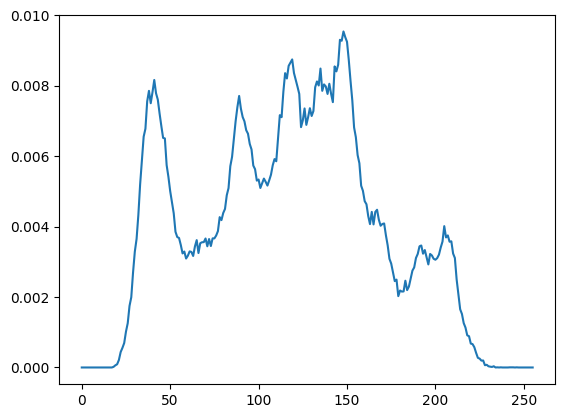

(<Figure size 640x480 with 1 Axes>,
 None)

In [63]:
# HISTOGRAMA
img = io.imread('lena.png')
Yfloat = color.rgb2gray(img)
Y = np.uint8(255 * Yfloat)

hh, _ = np.histogram(Y, 256, (0, 256), density = True) # density True normalizeaza histograma
# Y = matricea de valori pt care se calculeaza histograma
# 256 = numarul de bin-uri
# (0, 256) = Intervalul pentru valorile luate în considerare. Aici, include toată plaja de intensități pentru imagini în tonuri de gri 


print(np.shape(hh))
plt.figure(), plt.plot(hh), plt.show()

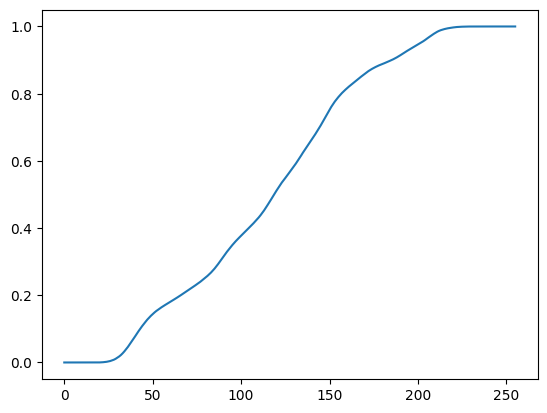

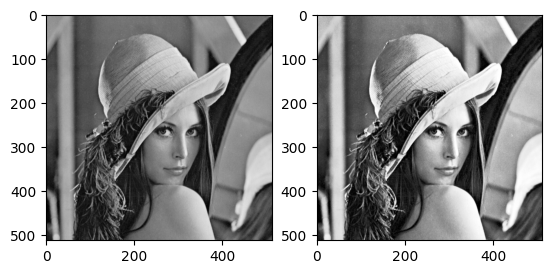

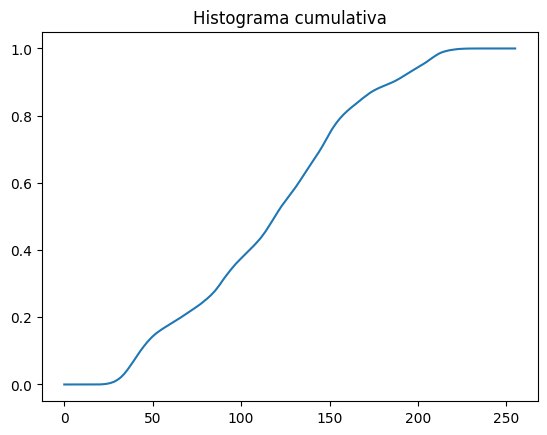

(<Figure size 640x480 with 1 Axes>,
 Text(0.5, 1.0, 'Histograma cumulativa'),
 None)

In [64]:
# HISTOGRAMA
img = io.imread('lena.png')
Yfloat = color.rgb2gray(img)
Y = np.uint8(255 * Yfloat)
hh, _ = np.histogram(Y, 256, (0, 256), density = True)

# HISTOGRAMA CUMULATIVA - se foloseste la egalizarea de histograma
H = np.cumsum(hh)
plt.figure(), plt.plot(H), plt.show()

# EGALIZARE DE HISTOGRAMA
def egalizare_histograma(img):
    Yfloat = color.rgb2gray(img)
    
    h, _ = np.histogram(Yfloat, 256, (0, 1.000000001))
    h = h / np.sum(h)  # ca sa normam la 1
    H = np.cumsum(h)

    [L, C] = np.shape(Yfloat)
    imgout = np.zeros((L, C))

    for l in range(L):
        for c in range(C):
            imgout[l, c] = H[np.uint8(255 * Yfloat[l, c])]
    return imgout, H

img_egalizata, histograma_cumulativa =  egalizare_histograma(img)
plt.subplot(1, 2, 1)
plt.imshow(color.rgb2gray(img), cmap='gray')

plt.subplot(1, 2, 2)
plt.imshow(img_egalizata, cmap='gray')
plt.show()

plt.figure(), plt.plot(histograma_cumulativa), plt.title("Histograma cumulativa"), plt.show()



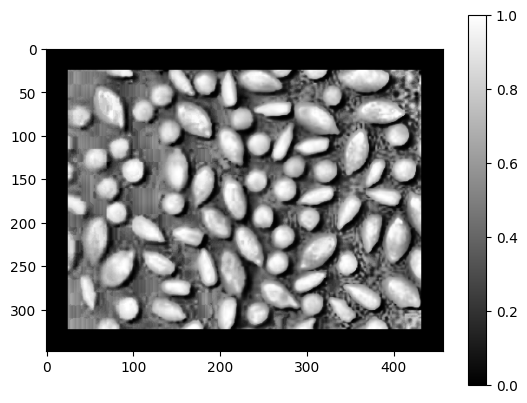

(348, 457)
(398, 507)


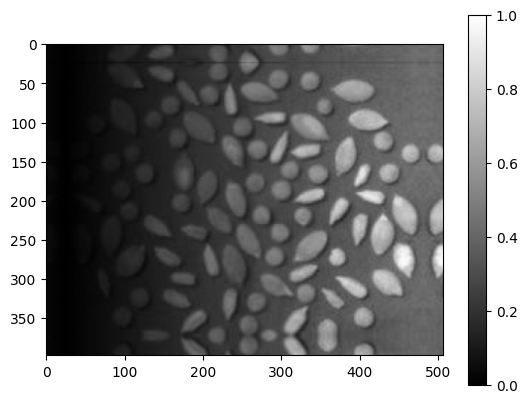

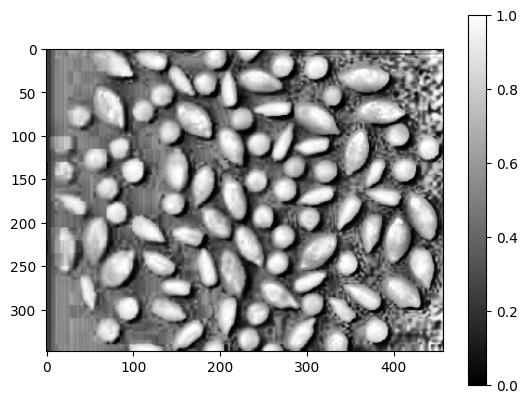

(<Figure size 640x480 with 2 Axes>,
 None)

In [65]:
# Adaptive Histogram Equalization (AHE)
def get_H_HE(img): # calculeaza functia de transfer pentru toata imaginea
    h, _ = np.histogram(img, 256, (0, 1.000000001))
    h = h / np.sum(h)  # ca sa normam la 1
    H = np.cumsum(h)
    return H

img = io.imread('uneven-grain.png')
img = img[:,:, 0] / 255.0 # impartim la 255 ca sa fie in intervalul 0, 1

# adaugam margine neagra
[L, C] = np.shape(img)
img_out = np.zeros((L, C))
W = 25
for l in range(W, L - W):
    for c in range(W, C- W):
        ROI = img[l-W: l+W+1, c-W:c+W+1]# region of interest - pun o fereastra patrata de dimensiune impara, W = dimensiunea lui ROI
        H = get_H_HE(ROI)
        img_out[l, c] = H[np.uint8(255 * img[l, c])]
        
plt.figure(), plt.imshow(img_out, cmap='gray', vmin = 0, vmax = 1), plt.colorbar(), plt.show()

# BORDAREA IMAGINII
from scipy import signal

kernel = np.zeros((2*W+1, 2*W+1))
kernel[W, W] = 1
img_bordata = signal.convolve2d(img, kernel, boundary='symm')

print(np.shape(img))
print(np.shape(img_bordata))

plt.figure(), plt.imshow(img_bordata, cmap='gray', vmin = 0, vmax = 1), plt.colorbar(), plt.show()

# EGALIZAREA DE HISTOGRAMA ADAPTIVA
img_egalizata = np.zeros((L, C))
for l in range(0, L):
    for c in range(0, C):
        ROI = img_bordata[l-W+W: l+W+W+1, c-W+W:c+W+W+1]
        H = get_H_HE(ROI)
        img_egalizata[l, c] = H[np.uint8(255 * img[l, c])]
        
plt.figure(), plt.imshow(img_egalizata, cmap='gray', vmin = 0, vmax = 1), plt.colorbar(), plt.show()

In [87]:
import numpy as np

# Funcție generică pentru adăugarea de zgomot gaussian
def add_gaussian_noise(img, std_dev):
    if img.dtype == np.uint8:
        img = img.astype(np.float32) / 255.0  # Normalize to [0, 1]
    noise = np.random.normal(0, std_dev, img.shape)
    img_out = img + noise
    img_out = np.clip(img_out, 0, 1)  # Clip to [0, 1]
    return (img_out * 255).astype(np.uint8)

# Funcție generică pentru adăugarea de zgomot impulsiv
def add_impulsive_noise(img, p0, p255):
    if img.dtype == np.uint8:  # Verificăm dacă imaginea este uint8
        img = img.astype(np.float32) / 255.0  # Normalizăm imaginea la intervalul [0, 1]
    
    h, w, c = img.shape
    img_out = img.copy()
    
    # Calculăm numărul de pixeli zgomotoși
    nr_px_0 = int(np.floor(p0 * h * w))
    nr_px_255 = int(np.floor(p255 * h * w))
    
    # Generăm coordonate unice pentru zgomotul impulsiv
    coords_0 = (np.random.randint(0, h, nr_px_0), np.random.randint(0, w, nr_px_0))
    coords_255 = (np.random.randint(0, h, nr_px_255), np.random.randint(0, w, nr_px_255))
    
    # Setăm pixelii la negru (0) sau alb (255)
    img_out[coords_0[0], coords_0[1], :] = 0
    img_out[coords_255[0], coords_255[1], :] = 1  # 1 pentru imagine normalizată
    
    # Convertim înapoi la uint8
    return (img_out * 255).astype(np.uint8)

def add_impulsive_noise2(img,p0,p1):
    if (np.max(img)>1):
        img = img/255.0
    [L,C,pl]=np.shape(img)
    Nrpix0 = int(L*C*p0)
    Nrpix1 = int(L*C*p1)
    
    for plan_curent in range(0,pl):
        numere_intregiL = np.random.randint(0,L,[Nrpix0])
        numere_intregiC = np.random.randint(0,C,[Nrpix0])
        img[numere_intregiL,numere_intregiC,plan_curent]=0
        numere_intregiL = np.random.randint(0,L,[Nrpix1])
        numere_intregiC = np.random.randint(0,C,[Nrpix1])
        img[numere_intregiL,numere_intregiC,plan_curent]=1
    
    return img


In [83]:
# calculare METRICI DE CALITATE
def mse(img0, img): # img0 e imagiena de referinta
    if np.max(img) > 1:
        img = img / 255.0
    if np.max(img0) > 1:
        img0 = img0 / 255.0
    MSE = np.sum((img-img0)**2) / np.prod(np.shape(img))
    sumval = np.sum(img0**2) / np.prod(np.shape(img))
    NMSE = MSE / sumval
    return MSE, NMSE

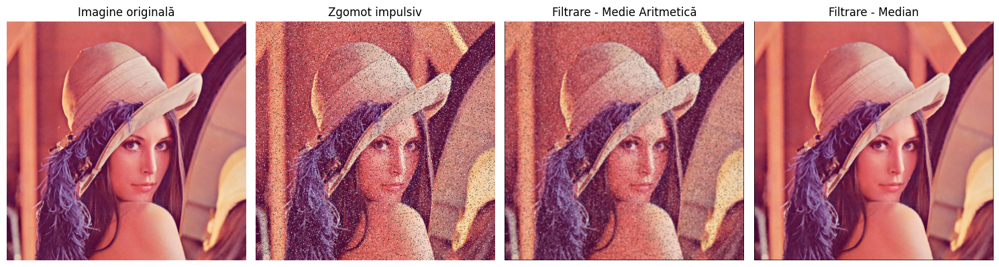

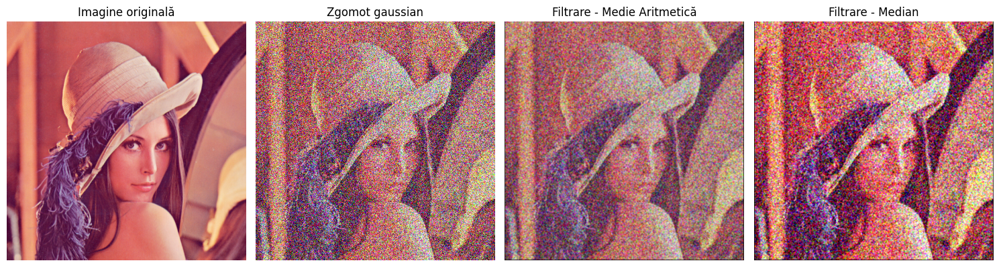

In [116]:
# FILTRARE LINIARA - GENERIC PENTRU MA si MAP
def filtrare_liniara(img, nucleu):
    if np.max(img) > 1:
        img = img / 255.0
    nucleu = nucleu / np.sum(nucleu)
    [d1, d2] = np.shape(nucleu)
    W = d1//2
    
    kernel = np.zeros((2*W+1, 2*W+1))
    kernel[W, W] = 1
    [L,C, nrplane] = np.shape(img)
    imgout = np.zeros(np.shape(img))
    
    for pl in range(0, 3):
        imgout[:,:,pl] = signal.convolve2d(img[:,:,pl], nucleu, mode='same', boundary='symm') # e la fel pt ca face bordarea implicit
                
    return imgout


# def mediere_aritmetica(img, dim_fereastra):
#     if img.dtype == np.uint8:  # Normalizăm imaginea dacă e în intervalul 0-255
#         img = img.astype(np.float32) / 255.0
#     
#     # Creăm o fereastră pentru filtrul mediei
#     kernel = np.ones((dim_fereastra, dim_fereastra)) / (dim_fereastra ** 2)
#     
#     # Aplicăm filtrul separat pe fiecare canal
#     img_out = np.zeros_like(img, dtype=np.float32)
#     for channel in range(img.shape[2]):
#         img_out[:, :, channel] = signal.convolve2d(
#             img[:, :, channel], kernel, boundary='symm', mode='same'
#         )
#     
#     # Convertim înapoi la uint8
#     return (np.clip(img_out, 0, 1) * 255).astype(np.uint8)

def mediere_aritmetica(img, dim_fereastra):
    h, w, c = img.shape
    img_out = np.zeros_like(img, dtype=np.uint8)
    offset = dim_fereastra // 2
    for y in range(offset, h - offset):
        for x in range(offset, w - offset):
            for channel in range(c):
                patch = img[y - offset:y + offset + 1, x - offset:x + offset + 1, channel]
                img_out[y, x, channel] = np.mean(patch)
    return img_out


def median_filter(img, dim_fereastra):
    h, w, c = img.shape
    img_out = np.zeros_like(img, dtype=np.uint8)
    offset = dim_fereastra // 2

    # Iterăm peste fiecare pixel (fără margini)
    for y in range(offset, h - offset):
        for x in range(offset, w - offset):
            for channel in range(c):
                # Extragem fereastra din jurul pixelului curent
                patch = img[y - offset:y + offset + 1, x - offset:x + offset + 1, channel]
                # Calculăm valoarea mediană
                img_out[y, x, channel] = np.median(patch)

    return img_out

img = io.imread("lena.png")

# Adăugare zgomot impulsiv
img_impulsiv = add_impulsive_noise(img, 0.05, 0.05)

# Adăugare zgomot gaussian
img_gaussian = add_gaussian_noise(img, 0.5)

# Aplicare filtru medie aritmetică
img_impulsiv_filtrat_MA = mediere_aritmetica(img_impulsiv, 3)
img_gaussian_filtrat_MA = mediere_aritmetica(img_gaussian, 3)

# Aplicare filtru median
img_impulsiv_filtrat_median = median_filter(img_impulsiv, 3)
img_gaussian_filtrat_median = median_filter(img_gaussian, 3)

# Afișare imagini
plt.figure(figsize=(15, 10))

plt.subplot(1, 4, 1)
plt.title("Imagine originală")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 4, 2)
plt.title("Zgomot impulsiv")
plt.imshow(img_impulsiv)
plt.axis("off")

plt.subplot(1, 4, 3)
plt.title("Filtrare - Medie Aritmetică")
plt.imshow(img_impulsiv_filtrat_MA)
plt.axis("off")

plt.subplot(1, 4, 4)
plt.title("Filtrare - Median")
plt.imshow(img_impulsiv_filtrat_median)
plt.axis("off")

plt.tight_layout()
plt.show()
########################################
plt.figure(figsize=(15, 10))
plt.subplot(1, 4, 1)
plt.title("Imagine originală")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 4, 2)
plt.title("Zgomot gaussian")
plt.imshow(img_gaussian)
plt.axis("off")

plt.subplot(1, 4, 3)
plt.title("Filtrare - Medie Aritmetică")
plt.imshow(img_gaussian_filtrat_MA)
plt.axis("off")

plt.subplot(1, 4, 4)
plt.title("Filtrare - Median")
plt.imshow(img_gaussian_filtrat_median)
plt.axis("off")

plt.tight_layout()
plt.show()



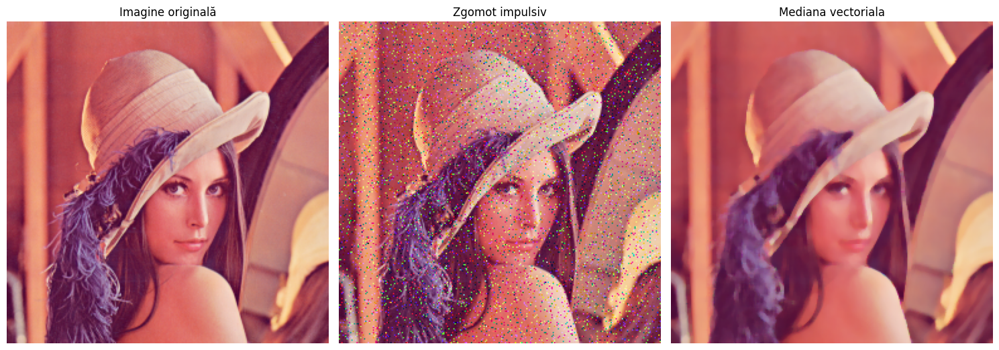

In [94]:
# FILTRAREA CU MEDIANA VECTORIALA
def median_scalar(img, dim):
    if(np.max(img)>1):
        img = img/255.0
    [L,C] = np.shape(img)
    kernel = np.zeros((dim, dim))
    poz_median = dim*dim//2
    W = dim//2
    kernel[W,W] = 1
    Ybordat = signal.convolve2d(img, kernel, mode='full', boundary = 'symm')
    imgout = np.zeros((L,C))
    for l in range (0, L):
        for c in range (0, C):
            #selecteaza valori conform ferestri plasate (l,c)
            val_selectate = Ybordat[l-W+W:l+W+1+W, c-W+W:c+W+1+W]
            #combina valorile selectate
            val_sortate = np.sort(np.ndarray.flatten(val_selectate))
            #scrie rezultatul in imgout[l,c]
            imgout[l,c]=val_sortate[poz_median]
    return imgout

def median_marginal(img, dim):
    if(np.max(img)>1):
        img = img/255.0
    [L,C,pl] = np.shape(img)
    imgout = np.zeros((L,C,pl))
    for p in range (0, pl):
        imgout[:,:,p] = median_scalar(img[:,:,p], dim)

    return imgout

img = io.imread("lenamic.png")

plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1), plt.title("Imagine originală"), plt.imshow(img), plt.axis("off")

img = img[:,:,0:3]
imgzg = add_impulsive_noise2(img, 0.03,0.03)
plt.subplot(1, 3, 2), plt.title("Zgomot impulsiv"), plt.imshow(imgzg), plt.axis("off")

img_median_marginal = median_marginal(imgzg,5)
plt.subplot(1, 3, 3), plt.title("Mediana vectoriala"), plt.imshow(img_median_marginal), plt.axis("off")

plt.tight_layout()
plt.show()


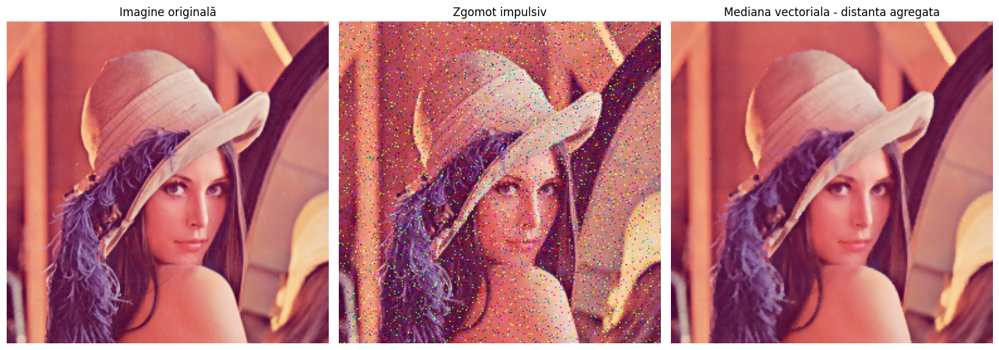

In [117]:
# FILTRU MEDIAN VECTORIAL OBTINUT PRIN ABORDAREA "DISTANTA AGREGATA"

def median_vectorial_dist_agregata(img, dim):
    if(np.max(img)>1):
        img = img/255.0
    [L,C,pl] = np.shape(img)
    kernel = np.zeros((dim, dim))
    poz_median = dim*dim//2
    W = dim//2
    kernel[W,W] = 1
    Ybordat = np.zeros((L+dim-1, C+dim-1, pl))
    for p in range (0,pl):
        Ybordat[:, :, p] = signal.convolve2d(img[:,:,p], kernel, mode='full', boundary = 'symm')

    MM = median_marginal(img, dim)

    #TEMA: schimbare median_marginal in media aritmetica ca punct de referinta + de facut diferenta
    imgout = np.zeros((L,C,pl))
    for l in range (0, L):
        for c in range (0, C):
            #selecteaza valori conform ferestri plasate (l,c)
            val_selectate = Ybordat[l-W+W:l+W+1+W, c-W+W:c+W+1+W, :]
            #combina valorile selectate
            
            #calculez distanta de la fiecare culoare din val_selectate 
            #la toate celelalte culori din val_selectate si sumez aceste distante
            dist = np.zeros((dim,dim))
            for i in range(0, dim):
                for j in range(0, dim):
                    vector_curent = val_selectate[i,j,:]
                    dist[i,j] = np.sum(np.sum(np.abs(val_selectate - vector_curent),axis=2))
            #aflam pe care pozitie din vecinatate se gaseste distanta minima
            pos = np.argmin(dist)
            pos_linie = pos//dim
            pos_col = pos%dim
            #scrie rezultatul in imgout[l,c]
            imgout[l,c,:]=val_selectate[pos_linie, pos_col,:]
    return imgout

img = io.imread("lenamic.png")

plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1), plt.title("Imagine originală"), plt.imshow(img), plt.axis("off")
img = img[:,:,0:3]

imgzg = add_impulsive_noise2(img, 0.03,0.03)
plt.subplot(1, 3, 2), plt.title("Zgomot impulsiv"), plt.imshow(imgzg), plt.axis("off")

imgrez_dist_agg = median_vectorial_dist_agregata(imgzg, 3)
plt.subplot(1, 3, 3), plt.title("Mediana vectoriala - distanta agregata"), plt.imshow(imgrez_dist_agg), plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# FILTRU MEDIAN VECTORIAL OBTINUT PRIN ABORDAREA "UNGHIULARA"
# TO DO? nu s-a facut in clasa

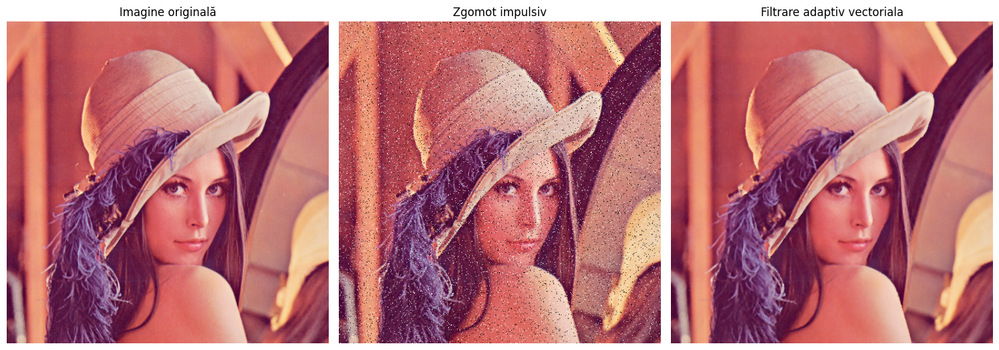

In [118]:
# FILTRU ADAPTIV VECTORIAL OBTINUT PRIN ABORDAREA "DISTANTA"

def adaptiv_dist_la_mm(img, dim, r):
    if np.max(img) > 1:
        img = img / 255.0  # Normalize to [0, 1]
    
    [L, C, pl] = np.shape(img)
    kernel = np.zeros((dim, dim))
    W = dim // 2
    kernel[W, W] = 1  # Center pixel
    
    # Pad the image and compute median marginal
    Ybordat = np.zeros((L + dim - 1, C + dim - 1, pl))
    for p in range(pl):
        Ybordat[:, :, p] = signal.convolve2d(img[:, :, p], kernel, mode='full', boundary='symm')
    
    MM = median_marginal(img, dim)  # Median marginal for each pixel
    imgout = np.zeros((L, C, pl))
    
    # Iterate over each pixel
    for l in range(L):
        for c in range(C):
            # Extract the window around the current pixel
            val_selectate = Ybordat[l:l + dim, c:c + dim, :]
            
            # Compute the distance from the median marginal
            dist = np.sum((val_selectate - MM[l, c, :]) ** 2, axis=2)
            
            # Handle zero distances (replace them with a large value temporarily)
            dist[dist == 0] = np.inf
            
            # Compute weights based on distance and scalar `r`
            a = (1 / dist) ** r
            a[dist == np.inf] = 1  # Assign full weight to zero-distance values
            w = a / np.sum(a)  # Normalize weights
            
            # Compute the output pixel by combining weighted values
            for plan in range(pl):
                imgout[l, c, plan] = np.sum(w * val_selectate[:, :, plan])
    
    return np.clip(imgout, 0, 1)  # Ensure values stay in [0, 1]

img = io.imread('lena.png')
img = img[:, :, 0:3]
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.title("Imagine originală"), plt.imshow(img), plt.axis("off")

imgzg = add_impulsive_noise(img, 0.03,0.03)
plt.subplot(1, 3, 2), plt.title("Zgomot impulsiv"), plt.imshow(imgzg), plt.axis("off")

img_rez_adaptiv = adaptiv_dist_la_mm(imgzg, 3, 1)
plt.subplot(1, 3, 3), plt.title("Filtrare adaptiv vectoriala"), plt.imshow(img_rez_adaptiv), plt.axis("off")

plt.tight_layout()
plt.show()




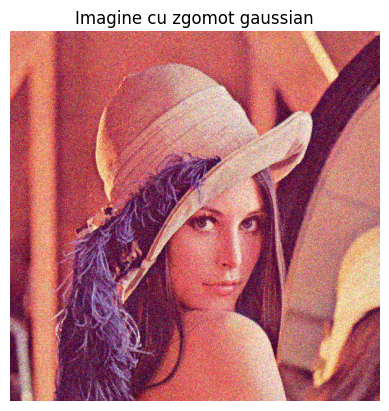

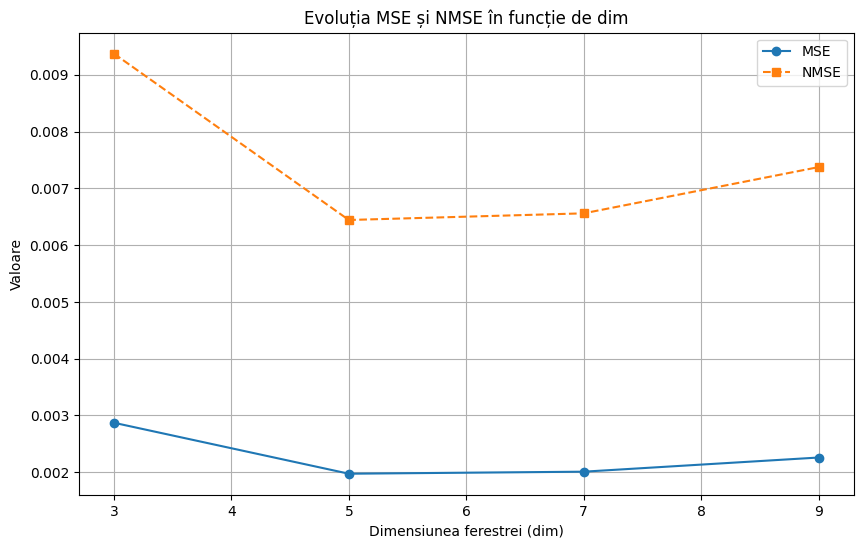

In [109]:
# GRAFIC AL DEPENDENTEI UNEI MASURI DE CALITATE A IMAGINII FILTRARE DE R
# RESPECTIV DE PUTEREA DE ZGOMOT

img = io.imread('lena.png')
img = img[:, :, 0:3] / 255.0  # Normalizează imaginea
imgzg = add_gaussian_noise(img, 0.1)  # Adaugă zgomot gaussian

plt.figure()
plt.imshow(imgzg)
plt.title("Imagine cu zgomot gaussian")
plt.axis("off")
plt.show()

# Inițializarea vectorilor pentru MSE și NMSE
mse_ = np.zeros(4)
nmse_ = np.zeros(4)

# Filtrare adaptivă și calculul MSE și NMSE
for idx, dim in enumerate(range(3, 10, 2)):
    imout = adaptiv_dist_la_mm(imgzg, dim, 2)
    imout = np.clip(imout, 0, 1)  # Asigură-te că valorile sunt valide
    mse_[idx], nmse_[idx] = mse(img, imout)  # Descompunem tuple-ul în două valori

# Afișare grafic MSE și NMSE
plt.figure(figsize=(10, 6))
plt.plot(range(3, 10, 2), mse_, marker='o', label='MSE')
plt.plot(range(3, 10, 2), nmse_, marker='s', label='NMSE', linestyle='--')
plt.xlabel('Dimensiunea ferestrei (dim)')
plt.ylabel('Valoare')
plt.title('Evoluția MSE și NMSE în funcție de dim')
plt.legend()
plt.grid()
plt.show()

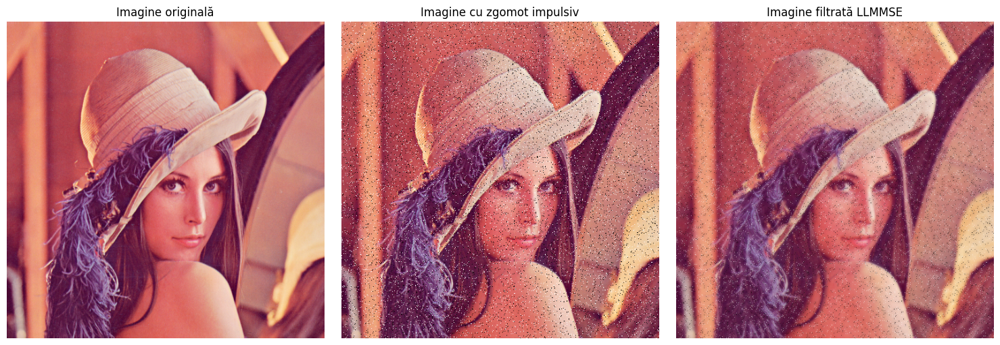

In [120]:
# FILTRU VECTORIAL LLMMSE
# asta a fost ca tema de terminat
import numpy as np
from scipy import signal

def adaptiv_llmmse(img, dim, r):
    if np.max(img) > 1:
        img = img / 255.0  # Normalizam la [0, 1]
    
    [L, C, pl] = np.shape(img)
    W = dim // 2  
    kernel = np.ones((dim, dim)) / (dim * dim)  # nucleu uniform

    # media marginală
    MM = np.zeros((L, C, pl))
    for p in range(pl):
        MM[:, :, p] = signal.convolve2d(img[:, :, p], kernel, mode='same', boundary='symm')

    Ybordat = np.zeros((L + dim - 1, C + dim - 1, pl))
    for p in range(pl):
        Ybordat[:, :, p] = np.pad(img[:, :, p], W, mode='symmetric')

    imgout = np.zeros((L, C, pl))

    # iteram fiecare pixel
    for l in range(L):
        for c in range(C):
            # extragem fereastra pentru pixelul curent (dim x dim x pl)
            val_selectate = Ybordat[l:l + dim, c:c + dim, :]  #  (dim, dim, pl)
            
            Kf = np.zeros((pl, pl)) 
            for i in range(pl):
                for j in range(pl):
                    Kf[i, j] = np.mean(
                        (val_selectate[:, :, i] - np.mean(val_selectate[:, :, i])) *
                        (val_selectate[:, :, j] - np.mean(val_selectate[:, :, j]))
                    )

            var_f = np.trace(Kf) / pl  # Variance of the signal
            
            # varianta de zgomot
            var_z = np.mean([
                np.var(val_selectate[:, :, i] - MM[l, c, i]) for i in range(pl)
            ])

            # (weight for LLMMSE)
            alpha = var_z / (var_f + var_z)

            for p in range(pl):
                imgout[l, c, p] = alpha * MM[l, c, p] + (1 - alpha) * img[l, c, p]

    return np.clip(imgout, 0, 1)


img = io.imread('lena.png')[:, :, :3] / 255.0
imgzg = add_impulsive_noise(img, 0.03, 0.03) 

filtered_img = adaptiv_llmmse(imgzg, dim=7, r=2) # fereaestra de 3 era cam mica

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title("Imagine originală")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(imgzg)
plt.title("Imagine cu zgomot impulsiv")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(filtered_img)
plt.title("Imagine filtrată LLMMSE")
plt.axis("off")

plt.tight_layout()
plt.show()



In [ ]:
# LAB 9